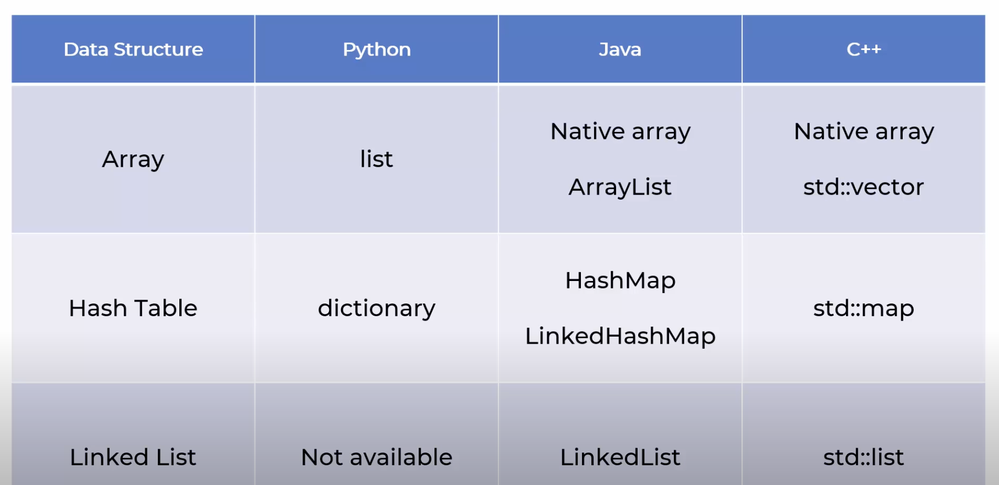

<h2 style='color:Blue'> Lists </h2>

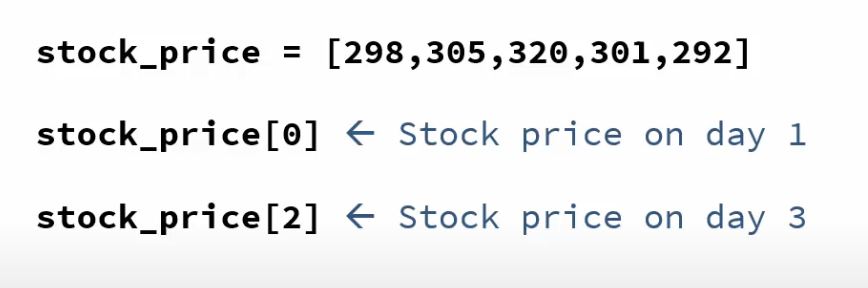

<p>
    search complexity o(n)
</p>

<h2 style='color:Blue'> Dictionary </h2>

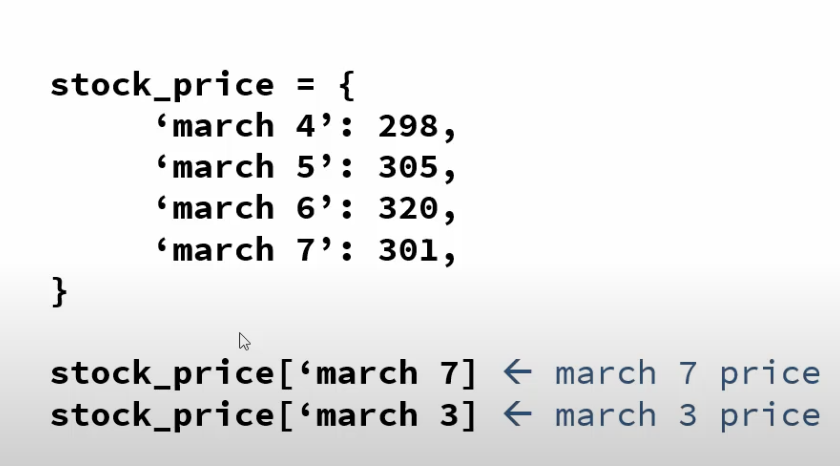

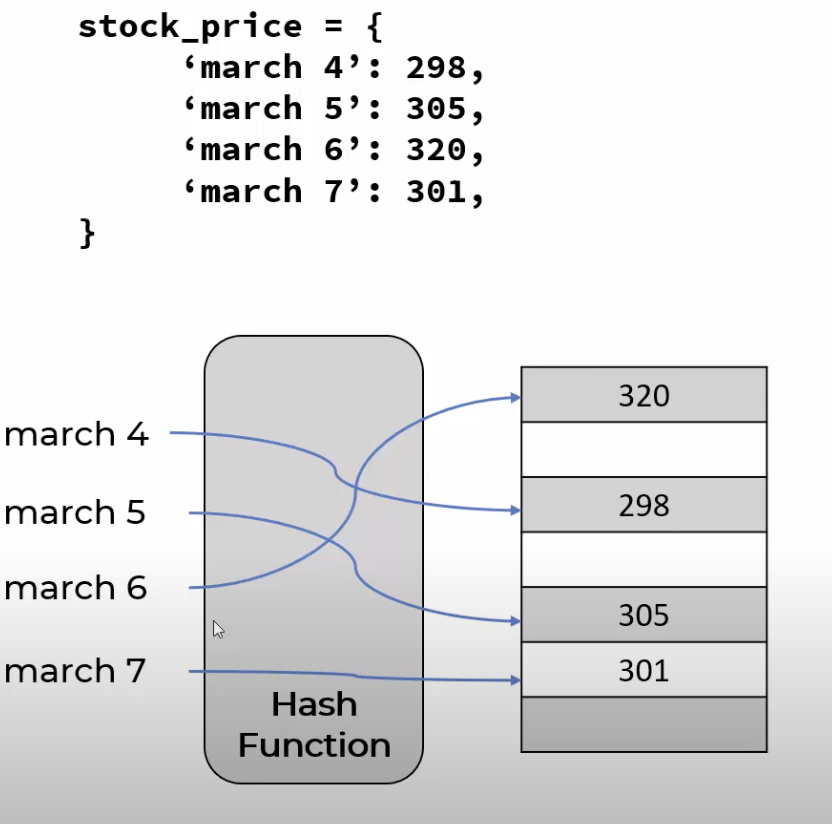

<p>
    search complexity O(1)
</p>

<h2 style='color:Blue'> Big O notation </h2>

<h2 style='color:Blue'> Arrays </h2>

How arrays are stored in memory 

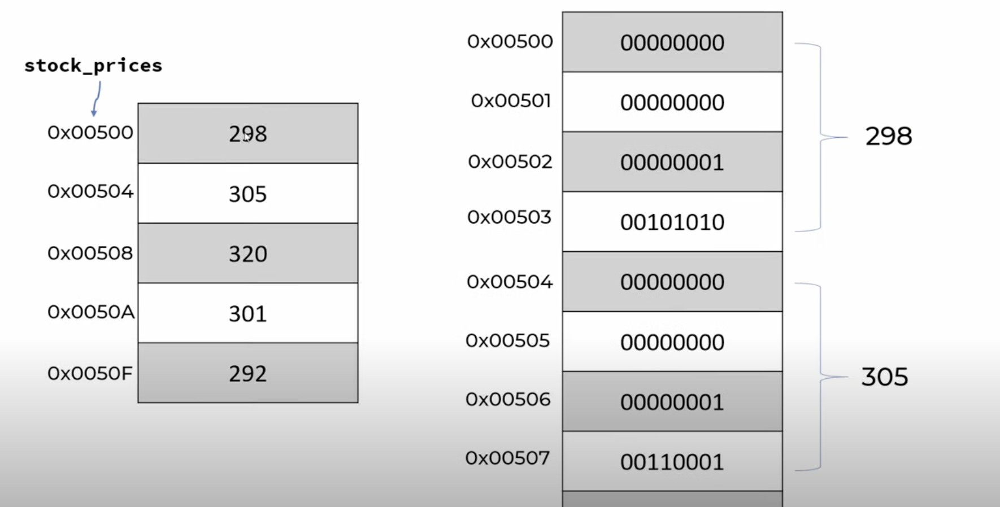

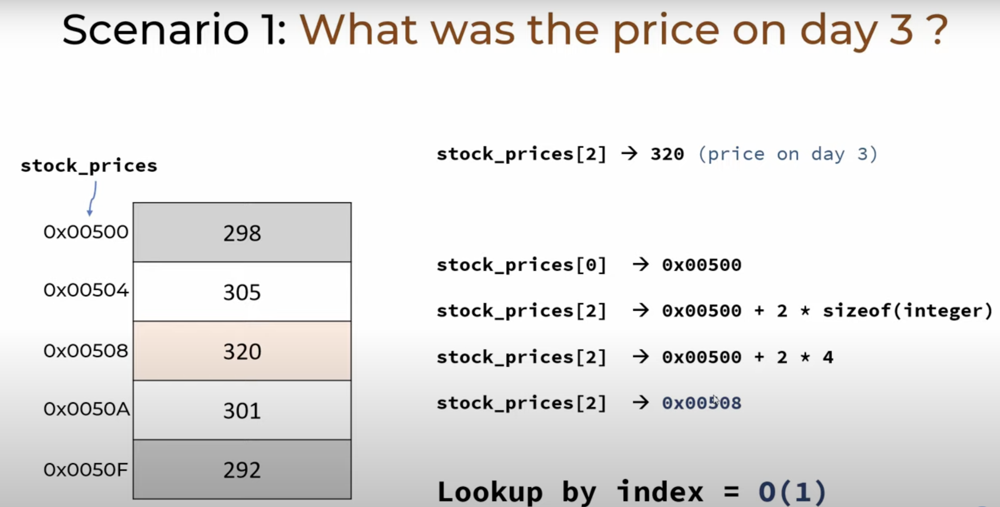

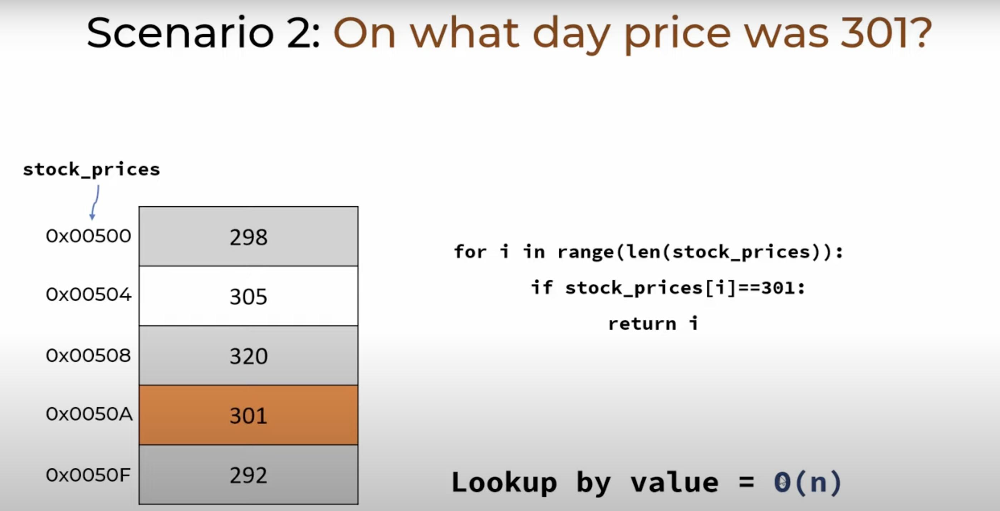

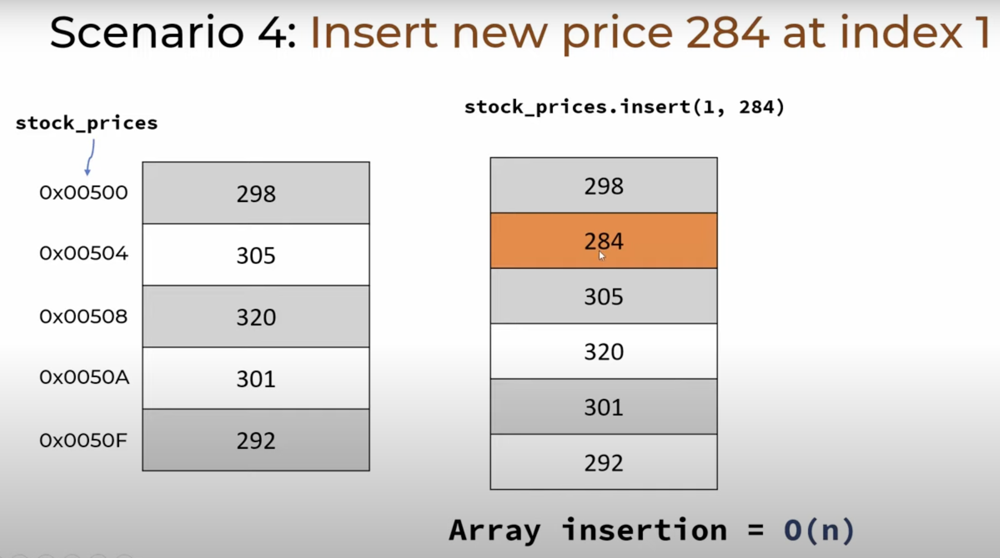

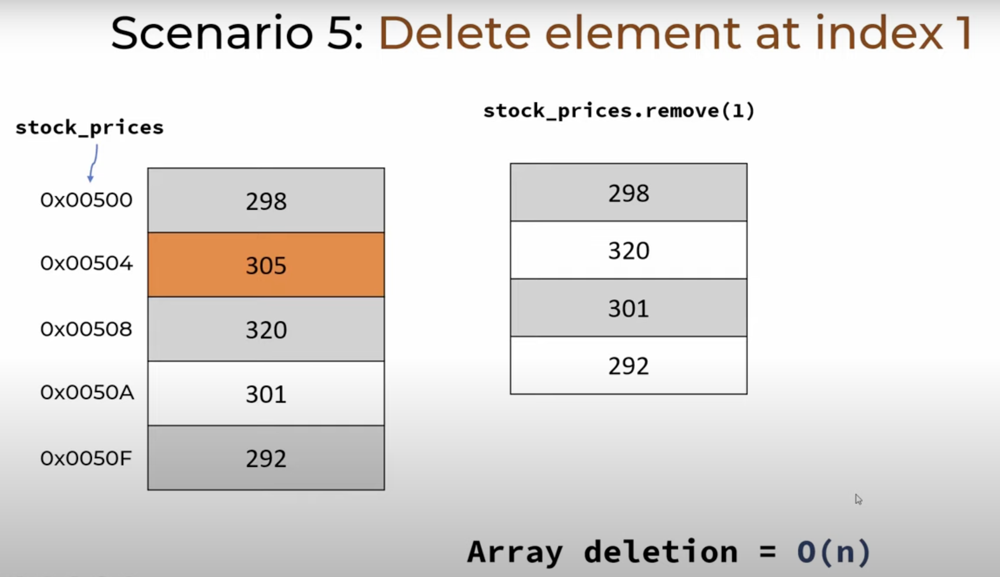

<h2 style='color:Blue'> Implement Linked List from python </h2>

<p>
    Linked List  vs  Array <br>
    You dont need to preallocate space arrays increase the space by 2x <br>
    insertion/deletion is easier no need to move elements
<p>

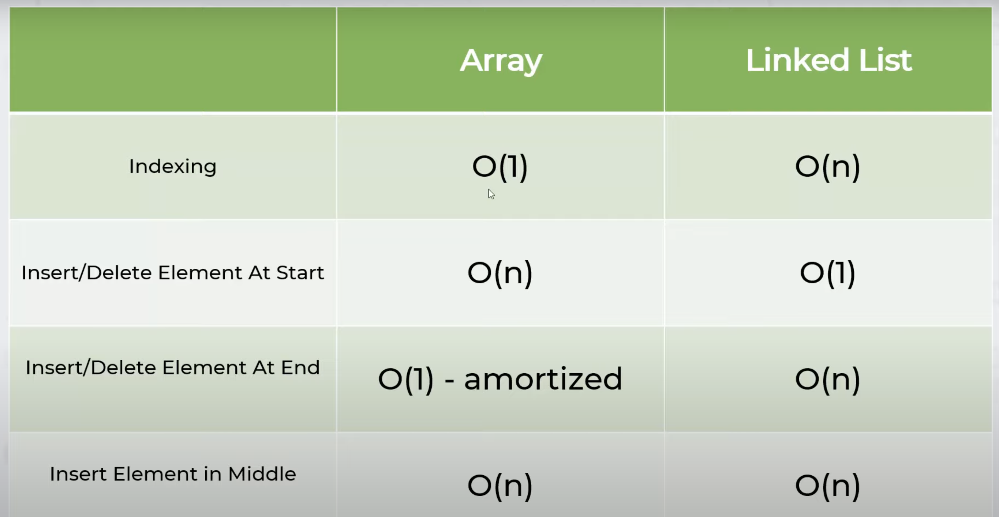

In [1]:
# Linked list do not want pre-allocated space
# insertion is easier not need to swap values as arrays

# linked list traversal - O(n)
# Access element by value - O(n)

class Node:
    def __init__(self, data, next):
        self.data = data
        self.next = next


class LinkedList:
    def __init__(self):
        self.head = None

    # here we insert data at the begining of linked list
    def insert_at_begining(self, data):
        self.head = Node(data, self.head)

    # here we insert data at the end of the linked list
    def insert_at_end(self, data):
        if self.head is None:
            self.insert_at_begining(data)
            return
        itr = self.head
        while itr.next:
            itr = itr.next
        itr.next = Node(data, None)

    # in here we get the data list and add those to a linked list
    def insert_values(self, data_list):
        self.head = None
        for data in data_list:
            self.insert_at_end(data)

    # in here insert value at a index
    def insert_at(self, data, index):
        if index > self.length():
            raise Exception("invalid index")
        elif index == 0:
            self.insert_at_begining(data)
            return
        else:
            count = 0
            itr = self.head
            while itr:
                if count + 1 == index:
                    itr.next = Node(data, itr.next)
                    break
                itr = itr.next
                count += 1

    # in here we enter the data after existing value
    def insert_after(self, data, existing_value):
        if self.head is None:
            raise Exception("Empty linked list")
        else :
            itr = self.head
            while itr:
                if itr.data == existing_value:
                    itr.next = Node(data, itr.next)
                    return
                itr = itr.next
            raise Exception("invalid existing value")

    # in here we remove element at index
    def remove_at(self, index):
        if index >= self.length():
            raise Exception("invalid index")
        elif index == 0:
            self.head = self.head.next
            return
        else:
            itr = self.head
            count = 0
            while itr:
                if (count + 1) == index:
                    itr.next = itr.next.next
                    break
                itr = itr.next
                count += 1

    # in here we are going to remove the node by value
    def remove(self, existing_value):
        if self.head is None:
            raise Exception("empty list")
        elif self.head.data == existing_value:
            self.head = self.head.next
        else:
            itr = self.head.next
            while itr.next:
                if itr.next.data == existing_value:
                    itr.next = itr.next.next
                    return
                itr = itr.next
            raise Exception("Not exists")

    # in here return the length of the linked list
    def length(self):
        if self.head is None:
            return 0
        count = 0
        itr = self.head
        while itr:
            count += 1
            itr = itr.next
        return count

    # in here print the data in linked list
    def print(self):
        if self.head is None:
            print("Empty list")
            return
        itr = self.head

        llstr = ''

        while itr:
            llstr += str(itr.data)
            itr = itr.next
            if itr is not None:
                llstr += ','
        print(llstr)

In [2]:
ll = LinkedList()
ll.insert_values(["banana", "apple", "grapes"])
ll.insert_after("mango","banana")
ll.print()


banana,mango,apple,grapes


<h2 style='color:Blue'> Python Dictionary is implement using Hashtable lets look </h2>

There are lot of hash functions <br>
For example we can use ascii values to take the hash of a value

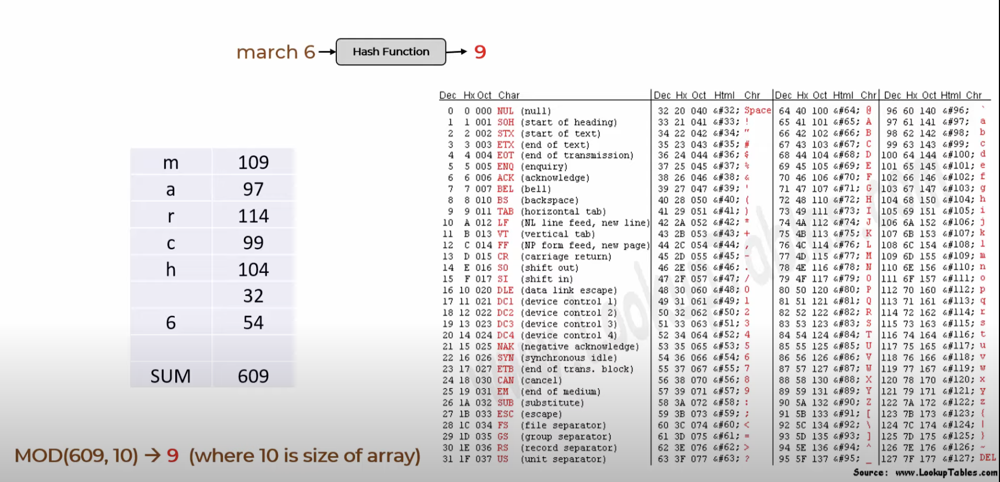

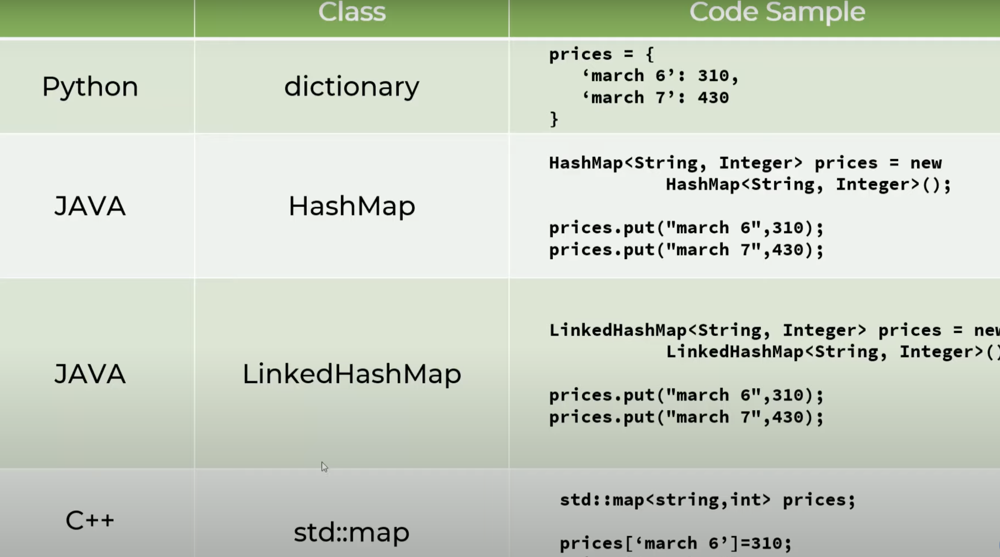

Lets implement hash function

In [3]:
def get_hash(key):
    hash = 0
    for char in key:
        hash += ord(char)
    return hash%100

In [5]:
ord(str(9))

57

In [8]:
get_hash('march 23')

56

In [9]:
class HashTable:
    def __init__(self):
        self.Max = 100
        self.arr = [None for i in range(self.Max)]

    def get_hash(self, key):
        h = 0
        for char in key:
            h += ord(char)
        return h % self.Max

    def add(self, key, value):
        h = self.get_hash(key)
        self.arr[h] = value

    def __setitem__(self, key, value):
        # this works as : ht['abc'] = 10
        h = self.get_hash(key)
        self.arr[h] = value

    def get(self, key):
        h = self.get_hash(key)
        return self.arr[h]

    def __getitem__(self, item):
        # this works as : ht['abc']
        h = self.get_hash(key)
        return self.arr[h]

    def __delitem__(self, key):
        h = self.get_hash(key)
        self.arr[h] = None

As we can see we have only 100 hash values <br>
if 2 keys have same hash what would happen 🧐 <br>
We can do 2 things <br>
1. we can store the value swith keys as list [(key1,value),(key2,value)] <br>
2. Other thing is if the hash is filled we can go on and check what is the next empty hash and put the values in that box<br>

In here we are building the 1st one

In [55]:
class HashTable:
    def __init__(self):
        self.Max = 10
        self.arr = [[] for i in range(self.Max)]

    def get_hash(self, key):
        h = 0
        for char in key:
            h += ord(char)
        return h % self.Max

    def add(self, key, value):
        h = self.get_hash(key)
        self.arr[h] = value

    def __setitem__(self, key, value):
        # this works as : ht['abc'] = 10
        h = self.get_hash(key)
        found = False
        for idx, element in enumerate(self.arr[h]):
            if len(element)==2 and element[0]==key:
                self.arr[h][idx] = (key, value)
                found = True
                break
        if not found:
            self.arr[h].append((key, value))

    def get(self, key):
        h = self.get_hash(key)
        return self.arr[h]

    def __getitem__(self, key):
        # this works as : ht['abc']
        h = self.get_hash(key)
        for element in self.arr[h]:
            if len(element)==2 and element[0]==key:
                return element[1]
        return 'Not found'

    def __delitem__(self, key):
        # this works as : del ht['abc']
        h = self.get_hash(key)
        for idx, element in enumerate(self.arr[h]):
            if len(element)==2 and element[0]==key:
                del self.arr[h][idx]
                return
        return 'Not found'

In [56]:
ht = HashTable()

In [57]:
ht.get_hash('march 6')

9

In [58]:
ht.get_hash('march 17')

9

In [59]:
ht['march 6']=128
ht['march 17']=18

In [60]:
ht['march 5']

'Not found'

In [61]:
ht['march 17']

18

In [62]:
ht['march 6']

128

In [63]:
ht.arr

[[], [], [], [], [], [], [], [], [], [('march 6', 128), ('march 17', 18)]]

In [64]:
del ht['march 6']

In [65]:
ht.arr

[[], [], [], [], [], [], [], [], [], [('march 17', 18)]]

<h2 style='color:Blue'> Python Stack </h2>